<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Data-Description" data-toc-modified-id="Data-Description-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data Description</a></span></li><li><span><a href="#Importing-libraries-and-loading-dataset" data-toc-modified-id="Importing-libraries-and-loading-dataset-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Importing libraries and loading dataset</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>EDA</a></span></li><li><span><a href="#Model-selection-and-training" data-toc-modified-id="Model-selection-and-training-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Model selection and training</a></span></li><li><span><a href="#Test-set-prediction" data-toc-modified-id="Test-set-prediction-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Test set prediction</a></span></li></ul></div>

# Introduction

Company Introduction
Your client for this project is an NGO.

The Happiness Foundation has been around for the last two decades and spans across more than 150 countries.
The NGO comprises professionals and grassroots workers from various walks of life.
The team includes young passionate individuals from different backgrounds who derive contentment by helping the needy, poor, and down-trodden.

Current Scenario
The foundation has gathered teams from across the world who have been invited for an exhibition of a system that determines the happiness of a particular individual based on certain factors.

The current process suffers from the following problems:

With the help of Gallup World Polls, they determine the happiness of individuals across various countries.
The current process is a resource and time-consuming given that data has to be collected from individuals, processed, analyzed, and then determined what the future results of polls will look like.
They want to automate the process of predicting the future poll results based on certain given factors.

They have hired you as a data science consultant. They want to supplement their analysis and prediction with a more feasible approach.

Your Role
You are given datasets of the world happiness report with Life Ladder indicating the happiness score of the individual.
Your task is to build a regression model using the datasets.
Because there was no machine learning model for this problem in the foundation, you don’t have a quantifiable win condition. You need to build the best possible model.

Project Deliverables
Deliverable: Predicts the Life Ladder score of individuals.
Machine Learning Task: Regression
Target Variable: Life Ladder
Win Condition: N/A (best possible model)

# Data Description

In [ ]:
' '''''

Dataset Feature Description
The Dataset contains the following columns:

Column Name	Description
Country name	Represents the country name of the individual
Year	Represents the year when the poll was conducted
Log GDP per capita	Log of GDP per capita of the country (estimated by the foundation)
Healthy life expectancy at birth	Represents the healthy life expectancy at birth in the country (estimated by the foundation)
Freedom to make life choices	Represents the freedom of choice score for the country (estimated by the foundation)
Generosity	Represents the generosity factor based on many polled factors (estimated by the foundation)
Perceptions of corruption	Represents an individual’s view on corruption in the country.
Positive affect	Represents the average score of happiness, laugh, and enjoyment scores of the concerned individual
Negative affect	Represents the average score of sadness, worry, and anger scores of the concerned individual
ID	Identifier of the individual
Life Ladder	Represents the happiness score or subjective well-being

'''''''

# Importing libraries and loading dataset

In [1]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Toolbox for Generating Statistics Report
!pip install -q yellowbrick                   # Toolbox for Measuring Machine Performance
!pip install -q imbalanced-learn              # Toolbox for Imbalanced Dataset
!pip install -q category-encoders             # Transformers Toolbox to Encode Categorical Variables as Numeric

     |████████████████████████████████| 69 kB 2.8 MB/s 
     |████████████████████████████████| 80 kB 2.5 MB/s 


In [2]:
!pip install -q --upgrade pandas-profiling
!pip install -q --upgrade yellowbrick

     |████████████████████████████████| 261 kB 4.0 MB/s 
     |████████████████████████████████| 675 kB 38.5 MB/s 
     |████████████████████████████████| 636 kB 38.8 MB/s 
     |████████████████████████████████| 62 kB 701 kB/s 
     |████████████████████████████████| 10.1 MB 40.9 MB/s 
     |████████████████████████████████| 102 kB 10.3 MB/s 
     |████████████████████████████████| 3.1 MB 48.2 MB/s 
     |████████████████████████████████| 812 kB 61.3 MB/s 
     |████████████████████████████████| 28.5 MB 48 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 271 kB 2.0 MB/s 


In [1]:
# For Panel Data Analysis
import pandas as pd
from pandas_profiling import ProfileReport
import pandas.util.testing as tm
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', None)
pd.set_option('mode.chained_assignment', None)

# For Numerical Python
import numpy as np

# For Random seed values
from random import randint

# For Scientifc Python
from scipy import stats

# For datetime
from datetime import datetime as dt

# For Data Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.offline import plot

# For Preprocessing
from sklearn.preprocessing import StandardScaler

# For Encoding Categorical Features
from category_encoders import TargetEncoder

# For Feature Selection
from sklearn.feature_selection import SelectFromModel

# For Feature Importances
from yellowbrick.model_selection import FeatureImportances

# For metrics evaluation
from sklearn.metrics import mean_squared_error, r2_score

# For Data Modeling
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# To Disable Warnings
import warnings
warnings.filterwarnings(action = "ignore")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [2]:
df=pd.read_csv('train_data.csv')

# EDA

In [3]:
df.head()

,Country name,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,ID,Life Ladder
0,Jordan,2008,9.343,0.766,64.22,NaN,-0.127,0.709,0.669,0.331,862,4.930
1,Estonia,2013,10.299,0.901,67.48,0.754,-0.201,0.726,0.702,0.199,534,5.367
2,Sweden,2018,10.881,0.931,72.60,0.942,0.077,0.263,0.823,0.161,1649,7.375
3,Tajikistan,2006,7.554,0.724,60.64,0.702,-0.088,0.768,0.566,0.195,1682,4.613
4,Kuwait,2014,10.945,NaN,65.80,NaN,NaN,NaN,NaN,NaN,925,6.180


In [4]:
df.shape

(1559, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1559 entries, 0 to 1558
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Country name                      1559 non-null   object 
 1   year                              1559 non-null   int64  
 2   Log GDP per capita                1533 non-null   float64
 3   Social support                    1549 non-null   float64
 4   Healthy life expectancy at birth  1522 non-null   float64
 5   Freedom to make life choices      1537 non-null   float64
 6   Generosity                        1488 non-null   float64
 7   Perceptions of corruption         1473 non-null   float64
 8   Positive affect                   1542 non-null   float64
 9   Negative affect                   1545 non-null   float64
 10  ID                                1559 non-null   int64  
 11  Life Ladder                       1559 non-null   float64
dtypes: flo

In [6]:
df.describe()

,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,ID,Life Ladder
count,1559.000000,1533.000000,1549.000000,1522.000000,1537.000000,1488.000000,1473.000000,1542.000000,1545.000000,1559.000000,1559.000000
mean,2013.131495,9.362995,0.812689,63.331680,0.741882,0.000343,0.748248,0.708551,0.267644,974.962797,5.469321
std,4.206026,1.160240,0.118762,7.478307,0.142326,0.163385,0.186708,0.108029,0.084431,562.023107,1.113280
min,2005.000000,6.635000,0.290000,32.300000,0.260000,-0.335000,0.035000,0.322000,0.083000,0.000000,2.375000
25%,2010.000000,8.460000,0.753000,58.340000,0.646000,-0.113000,0.691000,0.623000,0.206000,494.500000,4.649500
50%,2013.000000,9.456000,0.835000,65.180000,0.763000,-0.025000,0.804000,0.721000,0.258000,973.000000,5.374000
75%,2017.000000,10.332000,0.905000,68.535000,0.855000,0.091000,0.873000,0.798000,0.319000,1459.500000,6.272500
max,2020.000000,11.648000,0.987000,77.100000,0.985000,0.698000,0.983000,0.944000,0.705000,1948.000000,8.019000


In [7]:
df.isnull().sum()

Country name                        0 
year                                0 
Log GDP per capita                  26
Social support                      10
Healthy life expectancy at birth    37
Freedom to make life choices        22
Generosity                          71
Perceptions of corruption           86
Positive affect                     17
Negative affect                     14
ID                                  0 
Life Ladder                         0 
dtype: int64

In [8]:
zero=(df==0).sum()
zero

Country name                        0
year                                0
Log GDP per capita                  0
Social support                      0
Healthy life expectancy at birth    0
Freedom to make life choices        0
Generosity                          3
Perceptions of corruption           0
Positive affect                     0
Negative affect                     0
ID                                  1
Life Ladder                         0
dtype: int64

In [9]:
df.duplicated().any()

False

In [3]:
import pandas_profiling as pp
profile = pp.ProfileReport(df, title = "EDA")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

     |████████████████████████████████| 44 kB 1.4 MB/s 
Imported AutoViz_Class version: 0.0.84. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (1559, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    11 Predictors classified...
        This does not include the Target column(s)
        2 variables removed since they were ID or low-information variables
    List of variables removed: ['ID', 'Country name']

################ Regression VISUALIZATION Started #####################
Data Set Shape: 1559 rows, 10 cols
Data Set columns info:
* year: 0 nulls, 16 unique vals, most common: {2012: 11

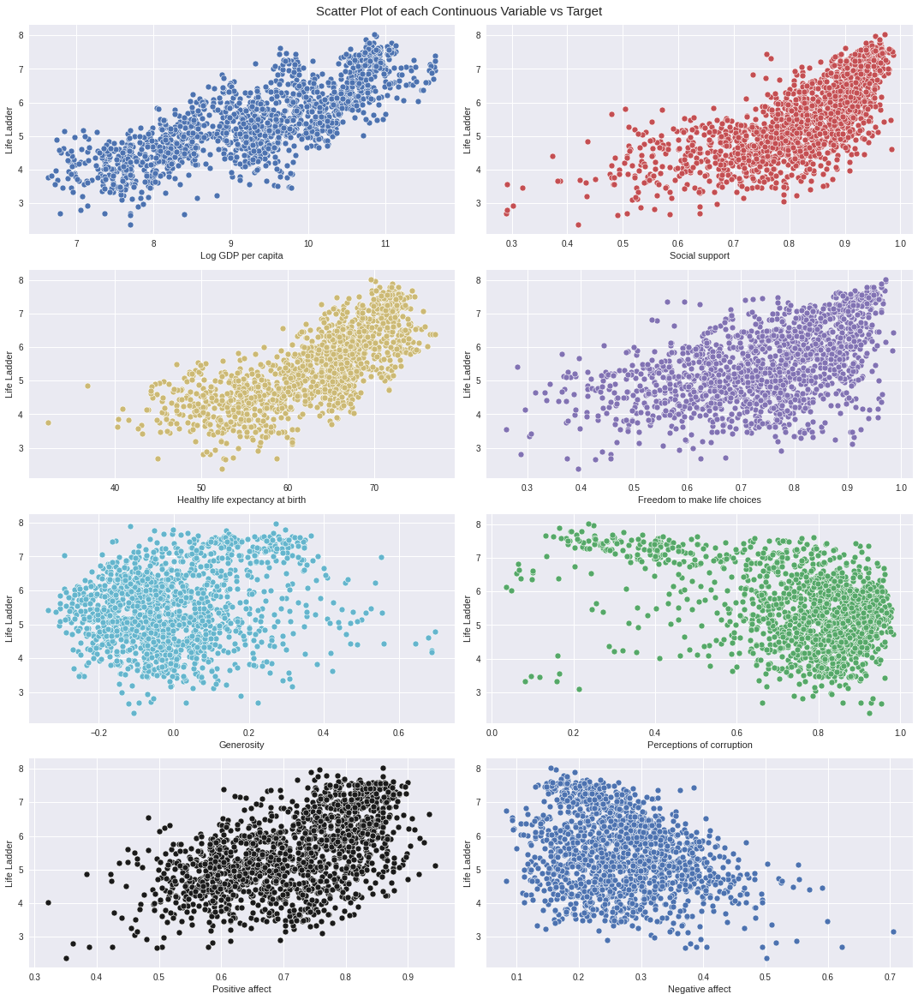

Number of All Scatter Plots = 36


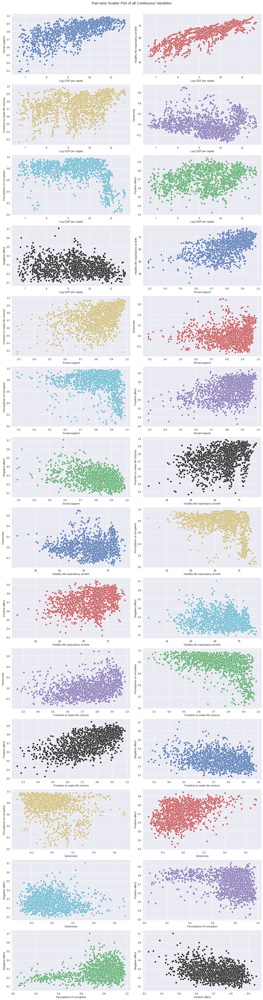

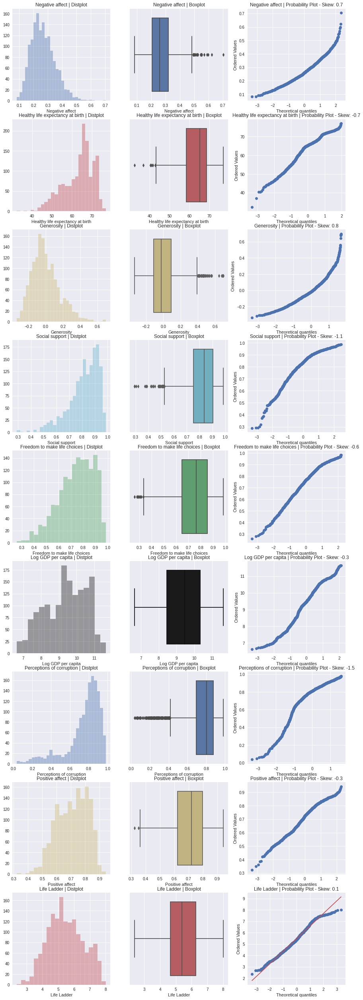

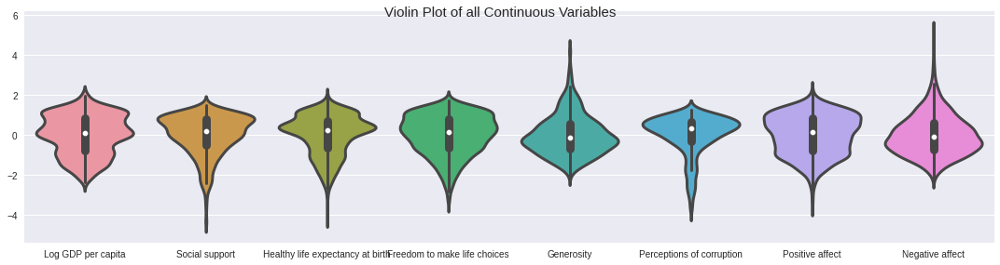

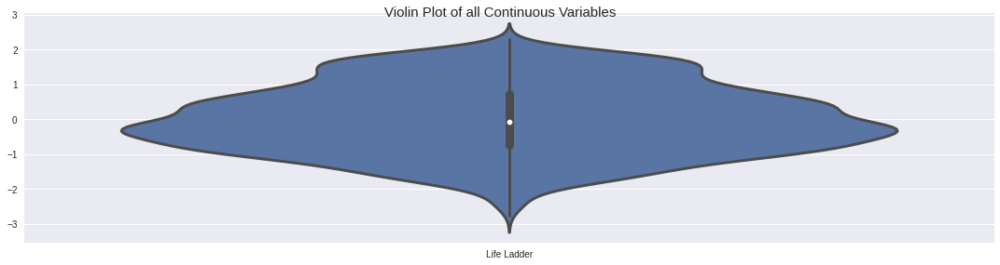

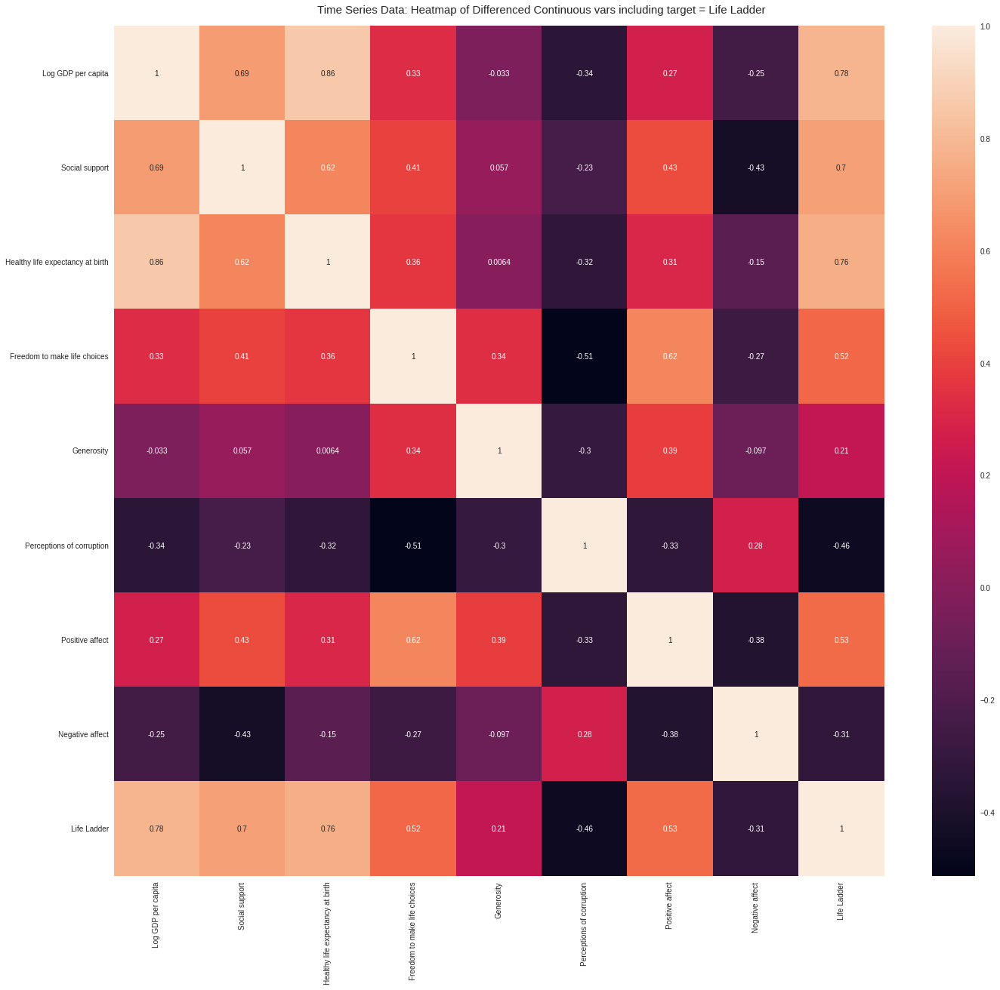

Could not draw Time Series plots
No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz (in seconds) = 26.425

 ###################### VISUALIZATION Completed ########################


<Figure size 1080x1152 with 0 Axes>

In [5]:
viz = AV.AutoViz(filename="",sep=',', depVar='Life Ladder', dfte=df, header=0, verbose=1, 
                 lowess=False, chart_format='svg')

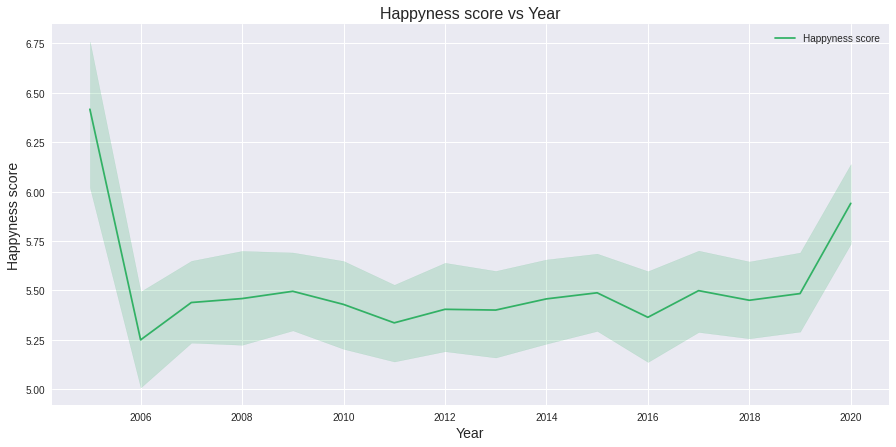

In [7]:
figure = plt.figure(figsize = [15, 7])
sns.lineplot(x = 'year', y = 'Life Ladder', data = df, color = '#32B165')

plt.xlabel('Year', size = 14)
plt.ylabel('Happyness score', size = 14)
plt.legend(labels = ['Happyness score'], loc = 'upper right', frameon = False)
plt.title('Happyness score vs Year', size = 16)
plt.show()

Total countries are:  165


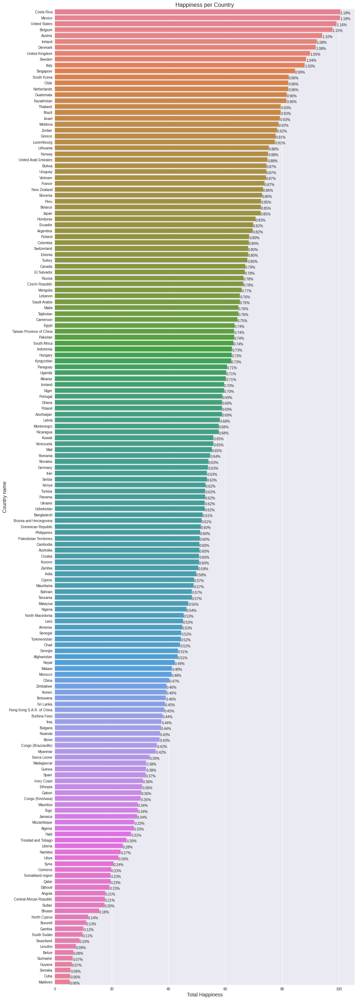

In [14]:
print('Total countries are: ', len(df['Country name'].value_counts().index))

avg_happiness_data = df.groupby(by = ['Country name'], as_index = False).agg('sum').sort_values(by = 'Life Ladder', ascending = False)

figure = plt.figure(figsize = [15, 50])

ax = sns.barplot(x = avg_happiness_data['Life Ladder'], y = avg_happiness_data['Country name'], 
                 palette  = sns.color_palette("husl", len(avg_happiness_data['Country name'].unique())))

total = avg_happiness_data['Life Ladder'].sum()
for p in ax.patches:
        percentage = '{:.2f}%'.format(100 * p.get_width() / total)
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y))

plt.xlabel('Total Happiness', size = 14)
plt.ylabel('Country name', size = 14)
plt.title('Happiness per Country', size = 16)
plt.show()

# Model selection and training

In [3]:
import pycaret
from pycaret.regression import *

In [4]:
reg = setup(data = df, target = 'Life Ladder')

,Description,Value
0,session_id,2570
1,Target,Life Ladder
2,Original Data,"(1559, 12)"
3,Missing Values,True
4,Numeric Features,9
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1091, 188)"


In [5]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.622000e-01,1.245000e-01,3.524000e-01,8.985000e-01,0.0614,5.340000e-02,1.141
br,Bayesian Ridge,2.926000e-01,1.514000e-01,3.889000e-01,8.766000e-01,0.0678,5.940000e-02,0.048
ridge,Ridge Regression,2.948000e-01,1.521000e-01,3.897000e-01,8.761000e-01,0.0680,5.990000e-02,0.021
rf,Random Forest Regressor,2.977000e-01,1.582000e-01,3.970000e-01,8.710000e-01,0.0680,6.000000e-02,1.206
lightgbm,Light Gradient Boosting Machine,3.064000e-01,1.663000e-01,4.062000e-01,8.639000e-01,0.0689,6.130000e-02,0.176
gbr,Gradient Boosting Regressor,3.281000e-01,1.788000e-01,4.225000e-01,8.543000e-01,0.0717,6.570000e-02,0.421
lr,Linear Regression,3.082000e-01,1.792000e-01,4.205000e-01,8.536000e-01,0.0720,6.170000e-02,0.327
huber,Huber Regressor,3.722000e-01,2.443000e-01,4.901000e-01,8.005000e-01,0.0831,7.530000e-02,0.196
ada,AdaBoost Regressor,3.998000e-01,2.488000e-01,4.979000e-01,7.971000e-01,0.0831,7.900000e-02,0.282
knn,K Neighbors Regressor,3.595000e-01,2.514000e-01,5.006000e-01,7.952000e-01,0.0859,7.310000e-02,0.078


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=2570, verbose=0, warm_start=False)

In [6]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2504,0.1266,0.3558,0.8931,0.0618,0.0507
1,0.2634,0.1256,0.3543,0.8973,0.0590,0.0523
2,0.2683,0.1114,0.3338,0.9119,0.0556,0.0529
3,0.2461,0.1176,0.3429,0.9017,0.0614,0.0509
4,0.2889,0.1496,0.3867,0.8804,0.0684,0.0597
5,0.2659,0.1340,0.3661,0.8893,0.0685,0.0577
6,0.2714,0.1262,0.3552,0.9110,0.0629,0.0564
7,0.2428,0.1055,0.3248,0.9162,0.0563,0.0491
8,0.2608,0.1129,0.3361,0.8973,0.0585,0.0528
9,0.2638,0.1357,0.3684,0.8865,0.0617,0.0514


In [7]:
tuned_et=tune_model(et)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3066,0.1806,0.4250,0.8475,0.0736,0.0620
1,0.3168,0.1596,0.3995,0.8695,0.0671,0.0630
2,0.3068,0.1516,0.3894,0.8801,0.0634,0.0602
3,0.2952,0.1564,0.3955,0.8692,0.0708,0.0618
4,0.3474,0.2057,0.4535,0.8355,0.0801,0.0720
5,0.3186,0.1889,0.4346,0.8439,0.0808,0.0691
6,0.3344,0.1921,0.4383,0.8645,0.0780,0.0702
7,0.2987,0.1616,0.4020,0.8716,0.0710,0.0611
8,0.3076,0.1630,0.4037,0.8517,0.0692,0.0624
9,0.3222,0.1970,0.4438,0.8353,0.0736,0.0636


In [8]:
tuned_et

ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mae',
                    max_depth=10, max_features=1.0, max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0005,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=10, min_weight_fraction_leaf=0.0,
                    n_estimators=270, n_jobs=-1, oob_score=False,
                    random_state=2570, verbose=0, warm_start=False)

In [9]:
evaluate_model(et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [10]:
predictions = predict_model(et)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.2786,0.1306,0.3614,0.8955,0.0609,0.0553


In [3]:
missing=['Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Generosity','Perceptions of corruption','Positive affect','Negative affect']

In [4]:
from sklearn.impute import KNNImputer
imputer = KNNImputer()
df[(missing)]=imputer.fit_transform(df[(missing)])

In [11]:
df.columns

Index(['Country name', 'year', 'Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Generosity', 'Perceptions of corruption', 'Positive affect',
       'Negative affect', 'ID', 'Life Ladder'],
      dtype='object')

In [5]:
df.drop(columns=['ID','Country name','year'],inplace=True)

In [6]:
X = df.drop('Life Ladder', axis = 1)
y = df['Life Ladder']

In [7]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [8]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

In [9]:
def PlotScore(y_train, y_train_pred, y_test, y_test_pred):
  '''
  Plot visual of acutal and predicted for train & test data
  y_train: actual values of y train
  y_train_pred: predicted values of y_train
  y_test: actual values of y_test
  y_test_pred: predicted values of y_test
  '''
  plt.figure(figsize = [13.66, 6])
  plt.subplot(1, 2, 1)
  sns.lineplot(x = y_train, y = y_train_pred, marker = 'o')
  plt.xlabel('Actual')
  plt.ylabel('Predicted')
  plt.title('For Train Data')

  plt.subplot(1, 2, 2)
  sns.lineplot(x = y_test, y = y_test_pred, marker = 'o')
  plt.xlabel('Actual')
  plt.ylabel('Predicted')
  plt.title('For Test Data')
  plt.show()

Acutal Values: [4.64  5.431 6.221 5.241 4.497]
Predicted Values: [4.73475 5.66194 6.73742 5.33566 4.38203]
RMSE (Train Data): 0.0
RMSE (Test Data): 0.44
R-Squared (Train Data): 100.0 %
R-Squared (Test Data): 84.0 %


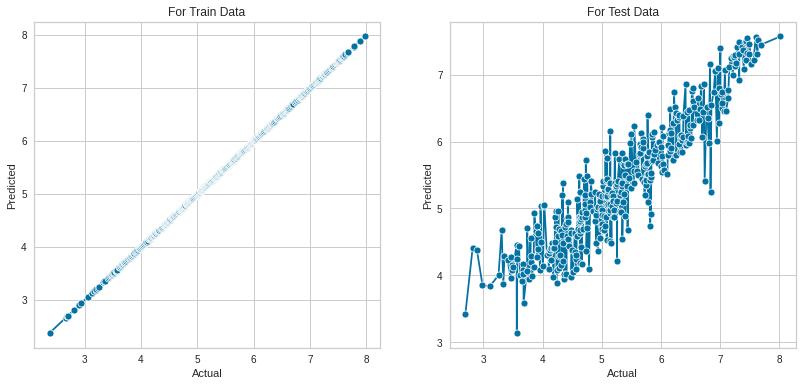

In [10]:
from sklearn.ensemble import ExtraTreesRegressor
extra_trees = ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=2570, verbose=0, warm_start=False)
extra_trees.fit(x_train, y_train)

y_train_pred = extra_trees.predict(x_train)
y_test_pred = extra_trees.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(extra_trees.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(extra_trees.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [4.64  5.431 6.221 5.241 4.497]
Predicted Values: [5.02149259 5.65798148 6.7927     5.36745926 4.23254259]
RMSE (Train Data): 0.36
RMSE (Test Data): 0.5
R-Squared (Train Data): 90.0 %
R-Squared (Test Data): 79.0 %


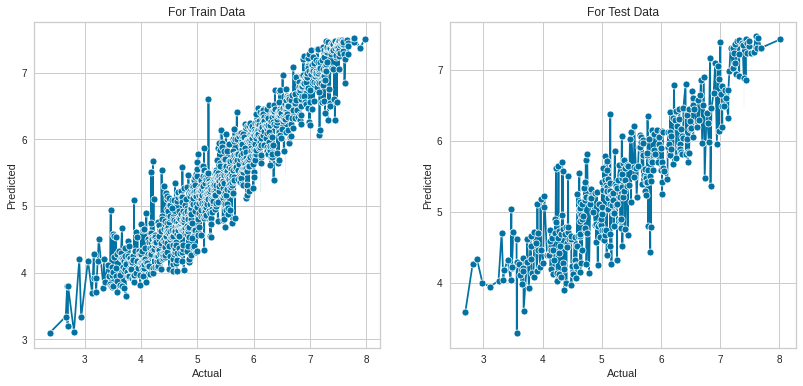

In [22]:
from sklearn.ensemble import ExtraTreesRegressor
extra_trees = ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mae',
                    max_depth=10, max_features=1.0, max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0005,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=10, min_weight_fraction_leaf=0.0,
                    n_estimators=270, n_jobs=-1, oob_score=False,
                    random_state=2570, verbose=0, warm_start=False)
extra_trees.fit(x_train, y_train)

y_train_pred = extra_trees.predict(x_train)
y_test_pred = extra_trees.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(extra_trees.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(extra_trees.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [4.64  5.431 6.221 5.241 4.497]
Predicted Values: [4.80642 5.9914  6.80568 5.05635 4.32207]
RMSE (Train Data): 0.15
RMSE (Test Data): 0.48
R-Squared (Train Data): 98.0 %
R-Squared (Test Data): 81.0 %


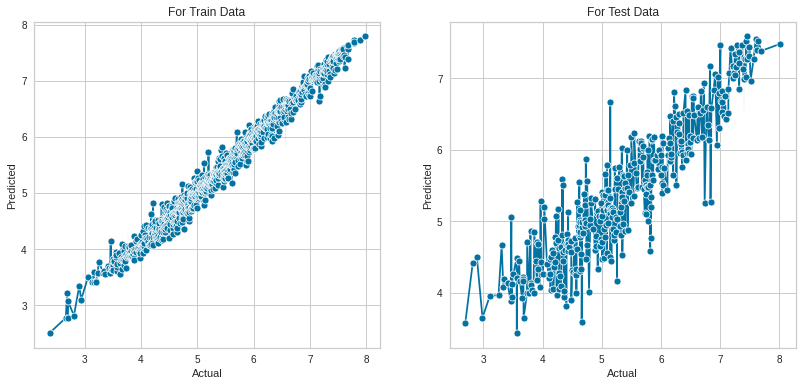

In [21]:

random_forest = RandomForestRegressor(random_state = 42)
random_forest.fit(x_train, y_train)

y_train_pred = random_forest.predict(x_train)
y_test_pred = random_forest.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(random_forest.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(random_forest.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [4.64  5.431 6.221 5.241 4.497]
Predicted Values: [4.80642 5.9914  6.80568 5.05635 4.32207]
RMSE (Train Data): 0.15
RMSE (Test Data): 0.48
R-Squared (Train Data): 98.0 %
R-Squared (Test Data): 81.0 %


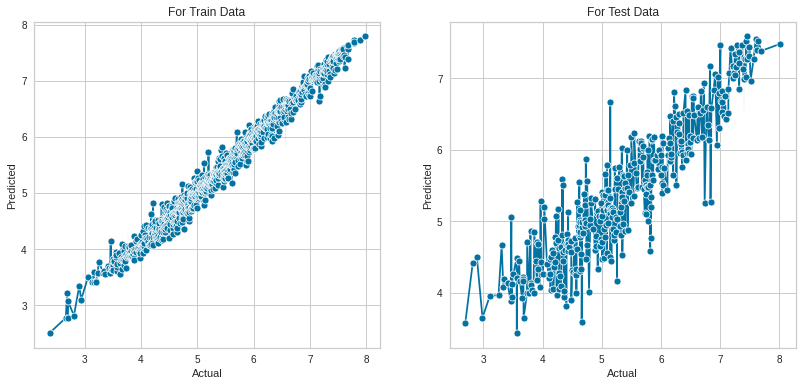

In [25]:
from lightgbm import LGBMRegressor
gbm =LGBMRegressor(random_state = 42)
gbm.fit(x_train, y_train)

y_train_pred = random_forest.predict(x_train)
y_test_pred = random_forest.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(gbm.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(gbm.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [4.64  5.431 6.221 5.241 4.497]
Predicted Values: [5.21670734 5.52926352 6.79709264 5.82261878 3.79222704]
RMSE (Train Data): 0.53
RMSE (Test Data): 0.6
R-Squared (Train Data): 78.0 %
R-Squared (Test Data): 71.0 %


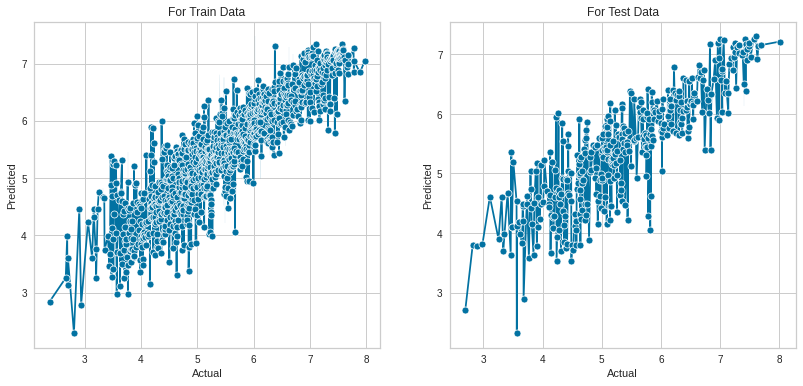

In [26]:
lr = LinearRegression()
lr.fit(x_train, y_train)

y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(lr.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(lr.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

In [29]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
def train(model, X, y):
    # train the model
    x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=42)
    model.fit(x_train, y_train)
    
    # predict the training set
    pred = model.predict(x_test)
    
    # perform cross-validation
    cv_score = cross_val_score(model, X, y, scoring='r2', cv=5)
    cv_score = np.abs(np.mean(cv_score))
    
    print("Model Report")
    print("RMSE:",np.sqrt(mean_squared_error(y_test, pred)))
    print('CV Score:', cv_score)

In [30]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
train(model, X, y)

Model Report
RMSE: 0.44968404141415136
CV Score: 0.8725692680488212


# Test set prediction

In [11]:
test=pd.read_csv('test_data.csv')

In [12]:
test_copy=test.copy()

In [33]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Country name                      390 non-null    object 
 1   year                              390 non-null    int64  
 2   Log GDP per capita                380 non-null    float64
 3   Social support                    387 non-null    float64
 4   Healthy life expectancy at birth  372 non-null    float64
 5   Freedom to make life choices      380 non-null    float64
 6   Generosity                        372 non-null    float64
 7   Perceptions of corruption         366 non-null    float64
 8   Positive affect                   385 non-null    float64
 9   Negative affect                   388 non-null    float64
 10  ID                                390 non-null    int64  
dtypes: float64(8), int64(2), object(1)
memory usage: 33.6+ KB


In [13]:
test[(missing)]=imputer.transform(test[(missing)])

In [14]:
test.drop(columns=['ID','Country name','year'],inplace=True)

In [15]:
test=scaler.transform(test)

In [16]:
pred_y=extra_trees.predict(test)

In [18]:
submission = pd.DataFrame({'ID ':test_copy['ID'],'Life Ladder':pred_y})

In [19]:
submission.to_csv('Submission.csv',header=False,index=False)

In [20]:
submission.head()

,ID,Life Ladder
0,1614,6.46549
1,1405,5.91771
2,974,4.89512
3,1055,6.06880
4,307,6.95044
